<a href="https://colab.research.google.com/github/Huma-Farooq/video_classification/blob/main/report_generation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
import re
import cv2
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
from tqdm import tqdm
sns.set_style("whitegrid")
from bs4 import BeautifulSoup
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
warnings.filterwarnings('ignore')
import xml.etree.ElementTree as ET
from google.colab.patches import cv2_imshow
from wordcloud import WordCloud, ImageColorGenerator
from sklearn.model_selection import train_test_split

In [ ]:
!wget --header="Host: openi.nlm.nih.gov" --header="User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/90.0.4430.212 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.9" --header="Accept-Language: en-US,en;q=0.9" --header="Referer: https://openi.nlm.nih.gov/faq" --header="Cookie: ncbi_sid=8A1BC6C8FFB50A11_1682SID; pmc.article.report=; _ga=GA1.2.1024901484.1610305706; lbnodeid=909381250.47873.0000; _ga=GA1.4.1024901484.1610305706; JSESSIONID=BD77221C4057639243BF80CB72FE15EA; _gid=GA1.2.1261986835.1621316665; _gid=GA1.4.1261986835.1621316665; _gat=1; _gat_nlmtracker=1; _gat_UA-137948717-1=1" --header="Connection: keep-alive" "https://openi.nlm.nih.gov/imgs/collections/NLMCXR_png.tgz" -c -O 'NLMCXR_png.tgz'

--2025-05-30 13:30:39--  https://openi.nlm.nih.gov/imgs/collections/NLMCXR_png.tgz
Resolving openi.nlm.nih.gov (openi.nlm.nih.gov)... 130.14.65.157, 2607:f220:41e:7065::157
Connecting to openi.nlm.nih.gov (openi.nlm.nih.gov)|130.14.65.157|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1360814128 (1.3G) [application/x-gzip]
Saving to: ‘NLMCXR_png.tgz’

NLMCXR_png.tgz       61%[===========>        ] 801.40M  2.14MB/s    eta 3m 57s 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [7]:
!wget --header="Host: openi.nlm.nih.gov" --header="User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/90.0.4430.93 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.9" --header="Accept-Language: en-US,en;q=0.9" --header="Referer: https://openi.nlm.nih.gov/faq" --header="Cookie: ncbi_sid=8A1BC6C8FFB50A11_1682SID; pmc.article.report=; _ga=GA1.2.1024901484.1610305706; lbnodeid=909381250.47873.0000; _ga=GA1.4.1024901484.1610305706; JSESSIONID=DC2AA13E34F6151F2CE3A739C64DD9DA; _gid=GA1.2.819975763.1621166700; _gid=GA1.4.819975763.1621166700; _gat=1; _gat_nlmtracker=1; _gat_UA-137948717-1=1" --header="Connection: keep-alive" "https://openi.nlm.nih.gov/imgs/collections/NLMCXR_reports.tgz" -c -O 'NLMCXR_reports.tgz'

--2025-05-30 12:16:50--  https://openi.nlm.nih.gov/imgs/collections/NLMCXR_reports.tgz
Resolving openi.nlm.nih.gov (openi.nlm.nih.gov)... 130.14.65.157, 2607:f220:41e:7065::157
Connecting to openi.nlm.nih.gov (openi.nlm.nih.gov)|130.14.65.157|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1112632 (1.1M) [application/x-gzip]
Saving to: ‘NLMCXR_reports.tgz’

NLMCXR_reports.tgz  100%[===================>]   1.06M  1.73MB/s    in 0.6s    

2025-05-30 12:16:51 (1.73 MB/s) - ‘NLMCXR_reports.tgz’ saved [1112632/1112632]



In [8]:
cwd = os.getcwd()

In [9]:
Image = '/content/drive/MyDrive/Images'

In [10]:
import tarfile
xml = tarfile.open('NLMCXR_reports.tgz')
xml.extractall(cwd+'/reports/')

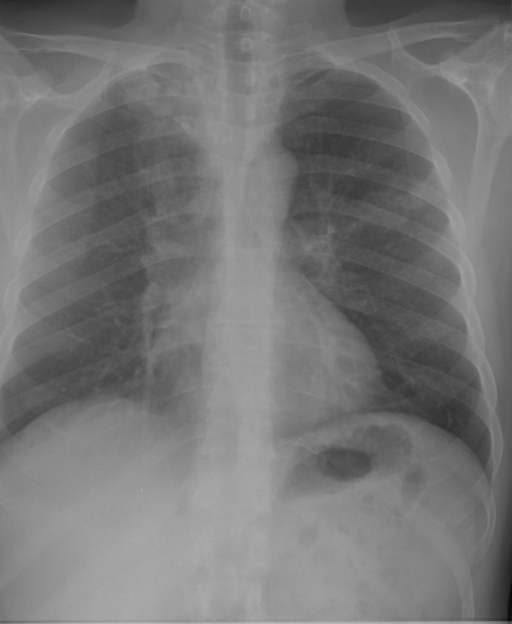

In [12]:
from IPython.display import Image
Image(filename='/content/drive/MyDrive/Images/CXR1000_IM-0003-3001.png')

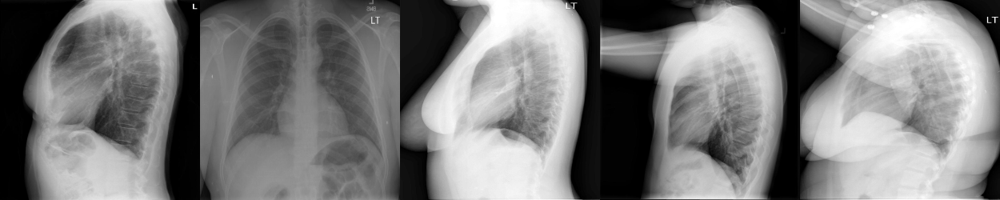

In [13]:
#print 5 sample images
img_lst=[]
for i in range(0,5):
  k = np.random.choice(range(len(os.listdir('/content/drive/MyDrive/Images'))))
  image_file = os.listdir('/content/drive/MyDrive/Images')[k]
  #getting an image file
  img = cv2.imread(os.path.join('/content/drive/MyDrive/Images',image_file))
  img = cv2.resize(img, (250, 250))
  img_lst.append(img)
img_lst = np.hstack(img_lst)
cv2_imshow(img_lst)

In [17]:
with open("/content/reports/ecgen-radiology/1.xml", 'r') as f:
    print(f.read())

<?xml version="1.0" encoding="utf-8"?>
<eCitation>
   <meta type="rr"/>
   <uId id="CXR1"/>
   <pmcId id="1"/>
   <docSource>CXR</docSource>
   <IUXRId id="1"/>
   <licenseType>open-access</licenseType>
   <licenseURL>http://creativecommons.org/licenses/by-nc-nd/4.0/</licenseURL>
   <ccLicense>byncnd</ccLicense>
   <articleURL/>
   <articleDate>2013-08-01</articleDate>
   <articleType>XR</articleType>
   <publisher>Indiana University</publisher>
   <title>Indiana University Chest X-ray Collection</title>
   <note>The data are drawn from multiple hospital systems.</note>
   <specialty>pulmonary diseases</specialty>
   <subset>CXR</subset>
   <MedlineCitation Owner="Indiana University" Status="supplied by publisher">
   
      <Article PubModel="Electronic">
      
         <Journal>
         
            <JournalIssue>
            
               <PubDate>
               
                  <Year>2013</Year>
               
                  <Month>08</Month>
               
            

In [18]:
print('Total Images in data : ', len(os.listdir('/content/drive/MyDrive/Images')))
print('Total Reports in data : ', len(os.listdir('/content/reports/ecgen-radiology')))

Total Images in data :  3489
Total Reports in data :  3955


In [19]:
#list of count of images
img_count = []
for file in os.listdir('/content/reports/ecgen-radiology'):
  xml_file = os.path.join('/content/reports/ecgen-radiology',file)
  #reading the xml data
  with open(xml_file, 'r') as f:
    data = f.read()
  #getting all the image names
  regex = r"parentImage id.*"
  k  = re.findall(regex,data)
  temp = len(k)
  img_count.append(temp)

print("The max number of images associated with a report:",np.array(img_count).max())
print("The min number of images associated with a report:",np.array(img_count).min())

The max number of images associated with a report: 5
The min number of images associated with a report: 0


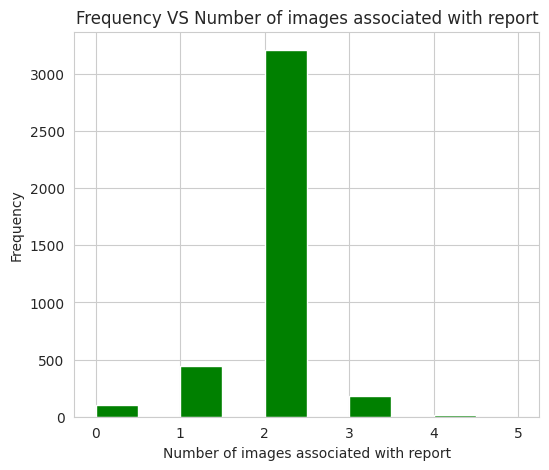

In [20]:
plt.figure(figsize = (6,5))
ax = pd.Series(img_count).plot(kind='hist',color='green')
ax.set_xlabel('Number of images associated with report')
ax.set_title("Frequency VS Number of images associated with report")
plt.show()

In [21]:
print("Images per patient :\n")
print(pd.Series(img_count).value_counts())

Images per patient :

2    3208
1     446
3     181
0     104
4      15
5       1
Name: count, dtype: int64


In [22]:
#Reference : https://stackoverflow.com/questions/2723015/how-to-find-recursively-for-a-tag-of-xml-using-lxml

columns = ["image_name", "image_caption", "comparison", "indication", "findings", "impression"]
dataframe = pd.DataFrame(columns = columns)
for file in tqdm(os.listdir('/content/reports/ecgen-radiology/')):
    #find files with .xml extension only
    if file.endswith(".xml"):
        # finding root element
        tree = ET.parse('/content/reports/ecgen-radiology/'+file)#parse the xml file

        findings = tree.find(".//AbstractText[@Label='FINDINGS']").text
        indication = tree.find(".//AbstractText[@Label='INDICATION']").text
        comparision = tree.find(".//AbstractText[@Label='COMPARISON']").text
        impression = tree.find(".//AbstractText[@Label='IMPRESSION']").text

        caption = set()
        name_img = set()
        #find images in each parentImage tag
        for iterator in tree.findall("parentImage"):
            img = iterator.attrib['id']+".png"
            name_img.add(img)
            #add the corresponding report for each image
            caption.add('' if iterator.find('caption').text is None else iterator.find('caption').text)

        # Create a new Series with the data
        new_row = pd.Series([','.join(name_img), ','.join(caption), comparision, indication, findings, impression],
                             index = columns)

        # Use concat to add the new row to the dataframe
        dataframe = pd.concat([dataframe, new_row.to_frame().T], ignore_index=True)

100%|██████████| 3955/3955 [00:03<00:00, 1272.11it/s]


In [24]:
dataframe.head()

,image_name,image_caption,comparison,indication,findings,impression
0,"CXR2799_IM-1231-2001.png,CXR2799_IM-1231-1001.png",PA and lateral chest radiograph (2 views) (2 i...,"PA and lateral views of the chest on XXXX, XXXX.",Dyspnea,Lungs are clear bilaterally. Cardiac and media...,No acute cardiopulmonary abnormality.
1,"CXR2174_IM-0787-1001.png,CXR2174_IM-0787-2001.png",Xray Chest PA and Lateral,None,XXXX and XXXX.,The XXXX examination consists of frontal and l...,Unremarkable radiographs of the chest.
2,"CXR2154_IM-0774-1001.png,CXR2154_IM-0774-2001.png",Xray Chest PA and Lateral,No comparison chest x-XXXX.,"HYPERTENSION; Pre op for colon surgery,",None,Well-expanded and clear lungs. Apical oligemia...
3,"CXR2795_IM-1227-1001.png,CXR2795_IM-1227-2001.png",PA and lateral chest x-XXXX,None,XXXX-year-old female with edema and dyspnea.,Cardiomediastinal silhouettes are within norma...,Diffuse reticulonodular pattern bilaterally. T...
4,"CXR1382_IM-0245-1001.png,CXR1382_IM-0245-2001.png",Xray Chest PA and Lateral,"XXXX, XXXX.",XXXX.,2 images. Heart size and pulmonary vascular en...,No acute cardiopulmonary abnormality identified.


In [25]:
# Shape of the DataFrame
print('Shape of the Dataframe : ', dataframe.shape)

Shape of the Dataframe :  (3955, 6)


In [26]:
# function for obtaining the different information part of the xml report file and preprocessing them and also adding the concernced image and report information to the dataframe
def decontracted(phrase): #https://stackoverflow.com/a/47091490
  """
  performs text decontraction of words like won't to will not
  """
  # specific
  phrase = re.sub(r"won\'t", "will not", phrase)
  phrase = re.sub(r"can\'t", "can not", phrase)

  # general
  phrase = re.sub(r"n\'t", " not", phrase)
  phrase = re.sub(r"\'re", " are", phrase)
  phrase = re.sub(r"\'s", " is", phrase)
  phrase = re.sub(r"\'d", " would", phrase)
  phrase = re.sub(r"\'ll", " will", phrase)
  phrase = re.sub(r"\'t", " not", phrase)
  phrase = re.sub(r"\'ve", " have", phrase)
  phrase = re.sub(r"\'m", " am", phrase)
  return phrase

In [27]:
def preprocess_text(data): #https://regex101.com/
  """
  extracts the information data from the xml file and does text preprocessing on them
  here info can be 1 value in this list ["COMPARISON","INDICATION","FINDINGS","IMPRESSION"]
  """
  preprocessed = []

  for sentence in tqdm(data.values):

    sentence = BeautifulSoup(sentence, 'lxml').get_text()

    regex = r"\d."
    sentence = re.sub(regex,"",sentence) #removing all values like "1." and "2." etc

    regex = r"X+"
    sentence = re.sub(regex,"",sentence) #removing words like XXXX

    regex = r"[^.a-zA-Z]"
    sentence = re.sub(regex," ",sentence) #removing all special characters except for full stop

    regex = r"http\S+"
    sentence = re.sub(regex,"", sentence)
    sentence = re.sub(r"[-()\"#/@;:<>{}`+=~|.!?$%^&*'/+_]+", "", sentence)
    sentence = re.sub('&', 'and',sentence)
    sentence = re.sub('@', 'at',sentence)
    sentence = re.sub('0', 'zero',sentence)
    sentence = re.sub('1', 'one',sentence)
    sentence = re.sub('2', 'two',sentence)
    sentence = re.sub('3', 'three',sentence)
    sentence = re.sub('4', 'four',sentence)
    sentence = re.sub('5', 'five',sentence)
    sentence = re.sub('6', 'six',sentence)
    sentence = re.sub('7', 'seven',sentence)
    sentence = re.sub('8', 'eight',sentence)
    sentence = re.sub('9', 'nine',sentence)
    sentence = re.sub('year old', "", sentence)#Occur multiple times in Indication feature but not necessary
    sentence = re.sub('yearold', "", sentence)
    sentence = decontracted(sentence) #perform decontraction
    sentence = sentence.strip().lower() #strips the begining and end of the string of spaces and converts all into lowercase
    sentence = " ".join(sentence.split()) #removes unwanted spaces
    if sentence=="": #if the resulting sentence is an empty string return null value
      sentence = np.nan
    preprocessed.append(sentence)
  return preprocessed

In [28]:
#Check for Null values in Text columns
NaN = dataframe.isnull().sum()
print("Total Nan Values in caption columns -",NaN[1])
print("Total Nan Values in comparison columns -",NaN[2])
print("Total Nan Values in Indication columns -",NaN[3])
print("Total Nan Values in findings columns   -",NaN[4])
print("Total Nan Values in Impression columns -",NaN[5])

Total Nan Values in caption columns - 0
Total Nan Values in comparison columns - 622
Total Nan Values in Indication columns - 90
Total Nan Values in findings columns   - 530
Total Nan Values in Impression columns - 34


In [29]:
#Replacing the nan values
dataframe['image_caption'] = dataframe['image_caption'].fillna('Unknown')
dataframe['comparison'] = dataframe['comparison'].fillna('No Comparison')
dataframe['indication'] = dataframe['indication'].fillna('No Indication')
dataframe['findings'] = dataframe['findings'].fillna('No Findings')
dataframe['impression'] = dataframe['impression'].fillna('No Impression')

In [30]:
#Check for Null values in Text columns
NaN = dataframe.isnull().sum()
print("Total Nan Values in caption columns -",NaN[1])
print("Total Nan Values in comparison columns -",NaN[2])
print("Total Nan Values in Indication columns -",NaN[3])
print("Total Nan Values in findings columns   -",NaN[4])
print("Total Nan Values in Impression columns -",NaN[5])

Total Nan Values in caption columns - 0
Total Nan Values in comparison columns - 0
Total Nan Values in Indication columns - 0
Total Nan Values in findings columns   - 0
Total Nan Values in Impression columns - 0


In [31]:
#Preprocessing of text features
dataframe['image_caption'] = preprocess_text(dataframe['image_caption'])
dataframe['comparison'] = preprocess_text(dataframe['comparison'])
dataframe['indication'] = preprocess_text(dataframe['indication'])
dataframe['findings'] = preprocess_text(dataframe['findings'])
dataframe['impression'] = preprocess_text(dataframe['impression'])

100%|██████████| 3955/3955 [00:00<00:00, 4093.67it/s]


In [32]:
dataframe.head()

,image_name,image_caption,comparison,indication,findings,impression
0,"CXR2799_IM-1231-2001.png,CXR2799_IM-1231-1001.png",pa and lateral chest radiograph views images,pa and lateral views of the chest on,dyspnea,lungs are clear bilaterally cardiac and medias...,no acute cardiopulmonary abnormality
1,"CXR2174_IM-0787-1001.png,CXR2174_IM-0787-2001.png",ray chest pa and lateral,no comparison,and,the examination consists of frontal and latera...,unremarkable radiographs of the chest
2,"CXR2154_IM-0774-1001.png,CXR2154_IM-0774-2001.png",ray chest pa and lateral,no comparison chest x,hypertension pre op for colon surgery,no findings,well expanded and clear lungs apical oligemia ...
3,"CXR2795_IM-1227-1001.png,CXR2795_IM-1227-2001.png",pa and lateral chest x,no comparison,female with edema and dyspnea,cardiomediastinal silhouettes are within norma...,diffuse reticulonodular pattern bilaterally th...
4,"CXR1382_IM-0245-1001.png,CXR1382_IM-0245-2001.png",ray chest pa and lateral,NaN,NaN,images heart size and pulmonary vascular engor...,no acute cardiopulmonary abnormality identified


In [33]:
dataframe.replace("", float("NaN"), inplace=True)

In [34]:
#percentage missing values
print(dataframe.isnull().sum()*100/dataframe.shape[0] )

image_name        2.629583
image_caption     2.680152
comparison       20.960809
indication        5.638432
findings          0.025284
impression        0.000000
dtype: float64


In [35]:
dataframe.dropna(subset = ["image_name"], inplace=True)
dataframe.shape

(3851, 6)

In [36]:
dataframe.head()

,image_name,image_caption,comparison,indication,findings,impression
0,"CXR2799_IM-1231-2001.png,CXR2799_IM-1231-1001.png",pa and lateral chest radiograph views images,pa and lateral views of the chest on,dyspnea,lungs are clear bilaterally cardiac and medias...,no acute cardiopulmonary abnormality
1,"CXR2174_IM-0787-1001.png,CXR2174_IM-0787-2001.png",ray chest pa and lateral,no comparison,and,the examination consists of frontal and latera...,unremarkable radiographs of the chest
2,"CXR2154_IM-0774-1001.png,CXR2154_IM-0774-2001.png",ray chest pa and lateral,no comparison chest x,hypertension pre op for colon surgery,no findings,well expanded and clear lungs apical oligemia ...
3,"CXR2795_IM-1227-1001.png,CXR2795_IM-1227-2001.png",pa and lateral chest x,no comparison,female with edema and dyspnea,cardiomediastinal silhouettes are within norma...,diffuse reticulonodular pattern bilaterally th...
4,"CXR1382_IM-0245-1001.png,CXR1382_IM-0245-2001.png",ray chest pa and lateral,NaN,NaN,images heart size and pulmonary vascular engor...,no acute cardiopulmonary abnormality identified


In [37]:
dataframe['image_count'] = dataframe['image_name'].astype(str).str.split(',').apply(len)

In [38]:
#Adding word count feature for indication, findings and impression
dataframe['indication_count'] = dataframe['indication'].astype(str).str.split().apply(lambda x: 0 if x==None else len(x))
dataframe['findings_count'] = dataframe['findings'].astype(str).str.split().apply(lambda x: 0 if x==None else len(x))
dataframe['impression_count'] = dataframe['impression'].astype(str).str.split().apply(lambda x: 0 if x==None else len(x))
dataframe.head()

,image_name,image_caption,comparison,indication,findings,impression,image_count,indication_count,findings_count,impression_count
0,"CXR2799_IM-1231-2001.png,CXR2799_IM-1231-1001.png",pa and lateral chest radiograph views images,pa and lateral views of the chest on,dyspnea,lungs are clear bilaterally cardiac and medias...,no acute cardiopulmonary abnormality,2,1,23,4
1,"CXR2174_IM-0787-1001.png,CXR2174_IM-0787-2001.png",ray chest pa and lateral,no comparison,and,the examination consists of frontal and latera...,unremarkable radiographs of the chest,2,1,24,5
2,"CXR2154_IM-0774-1001.png,CXR2154_IM-0774-2001.png",ray chest pa and lateral,no comparison chest x,hypertension pre op for colon surgery,no findings,well expanded and clear lungs apical oligemia ...,2,6,2,21
3,"CXR2795_IM-1227-1001.png,CXR2795_IM-1227-2001.png",pa and lateral chest x,no comparison,female with edema and dyspnea,cardiomediastinal silhouettes are within norma...,diffuse reticulonodular pattern bilaterally th...,2,5,33,21
4,"CXR1382_IM-0245-1001.png,CXR1382_IM-0245-2001.png",ray chest pa and lateral,NaN,NaN,images heart size and pulmonary vascular engor...,no acute cardiopulmonary abnormality identified,2,1,29,5


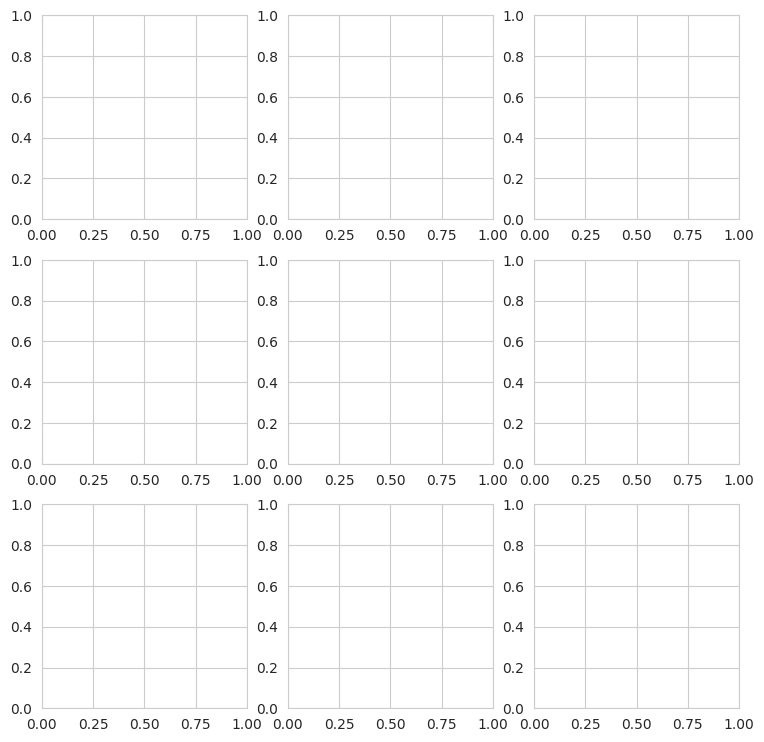

In [50]:
#Displaying sample 9 patient X-Ray
fig, axs = plt.subplots(3, 3, figsize = (9,9))
ax = axs.flatten()
for df, figure in zip(dataframe[0:10].itertuples(), ax):
    image=mpimg.imread("/content/drive/MyDrive/Images"+df.image_name.split(',')[0])
    figure.imshow(image)
plt.show()

In [ ]:
def show_image_captions(df,sample):
    '''This function prints the sample images and its other text features.
       Parameters :
       - df: dataframe
       - sample: Number of datapoints'''

    sampled_row = df.sample(sample)

    for count, row in sampled_row.iterrows():
        print("Caption :",row['image_caption'])
        imgs = row["image_name"].split(',')
        fig, axs = plt.subplots(1, len(imgs), figsize = (10,10))
        iterator = 0

        for img, figure in zip(imgs, axs.flat):
            image= mpimg.imread("/content/images/"+img)
            imgplot = axs[iterator].imshow(image)
            iterator +=1

        plt.show()
        print("\nComparision :",row.get('comparision'))
        print("\nIndication :",row.get('indication'))
        print("\nFindings :",row.get('findings'))
        print("\nImpression :",row.get('impression'))
        print("="*100,'\n')

Caption : chest frontal lateral


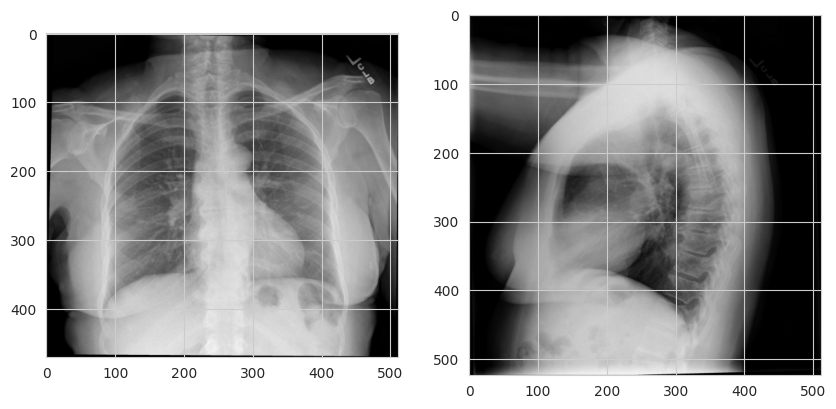


Comparision : None

Indication : chronic

Findings : the heart is top normal in size the mediastinum is unremarkable the lungs are clear

Impression : no acute disease

Caption : chest radiographs and lateral


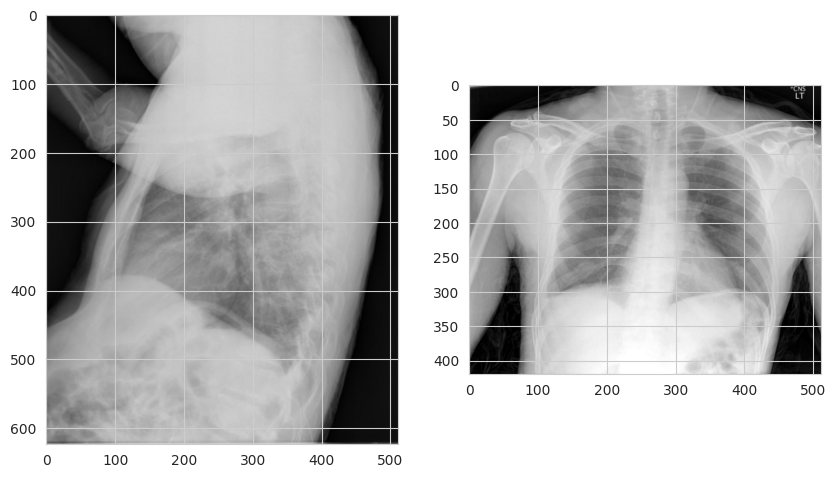


Comparision : None

Indication : male with seizure ethanol abuse

Findings : the heart size and mediastinal contours appear within normal limits there is blunting of the right lateral costophrenic sulcus which could be secondary to a small effusion versus scarring no focal airspace consolidation or pneumothorax no acute bony abnormalities

Impression : blunting of the right costophrenic sulcus could be secondary to a effusion versus scarring no focal airspace consolidation



In [ ]:
#showing sample 2 datapoints
show_image_captions(dataframe, 2)

In [ ]:
k = dataframe.loc[(dataframe.comparison == 'none') | (dataframe.comparison == 'no comparison')]
print("Number of rows with no informnation in comparision label:",k.shape[0])

Number of rows with no informnation in comparision label: 2005


In [ ]:
def unique_words_features(df):
    '''This function takes pandas dataframe and show barplot of features unique and repeated words
       Input  =  pandas dataframe or numpy arrays
       Output =  barplot of the unique words of dataframe '''

    #length of the feature
    len_total = len(df.tolist())

    #length of unique words in the featue
    len_unique = len(np.unique(df.tolist()))

    x = ['Total Values', 'Unique Values']
    y =  [len_total, len_unique]

    plt.bar(x,y,color = 'Teal')
    plt.ylabel('Word-Count')
    for index,data in enumerate(y):
        plt.text(x=index , y =data+1 , s=f"{data}" , fontdict=dict(fontsize=15))

    plt.ylabel('Word-Count')

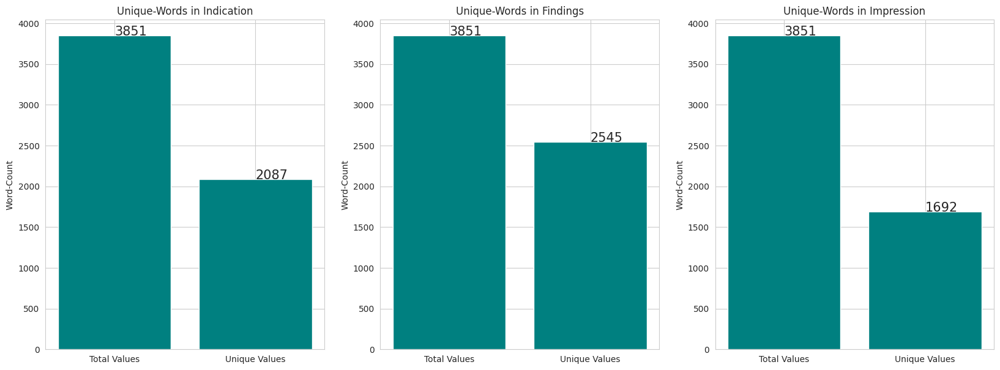

In [ ]:
plt.figure(figsize = (20,7))
plt.subplot(131)
unique_words_features(dataframe['indication'])
plt.title('Unique-Words in Indication')
plt.subplot(132)
unique_words_features(dataframe['findings'])
plt.title('Unique-Words in Findings')
plt.subplot(133)
unique_words_features(dataframe['impression'])
plt.title('Unique-Words in Impression')
plt.show()

In [ ]:
#Printing min,max and median of word_count
print("Maximum number of word count for Indication is:",np.max(dataframe.indication_count.values))
print("Minimum number of word count for Indication is:",np.min(dataframe.indication_count.values))
print("median number of word count for Indication is:",np.median(dataframe.indication_count.values))

Maximum number of word count for Indication is: 32
Minimum number of word count for Indication is: 1
median number of word count for Indication is: 3.0


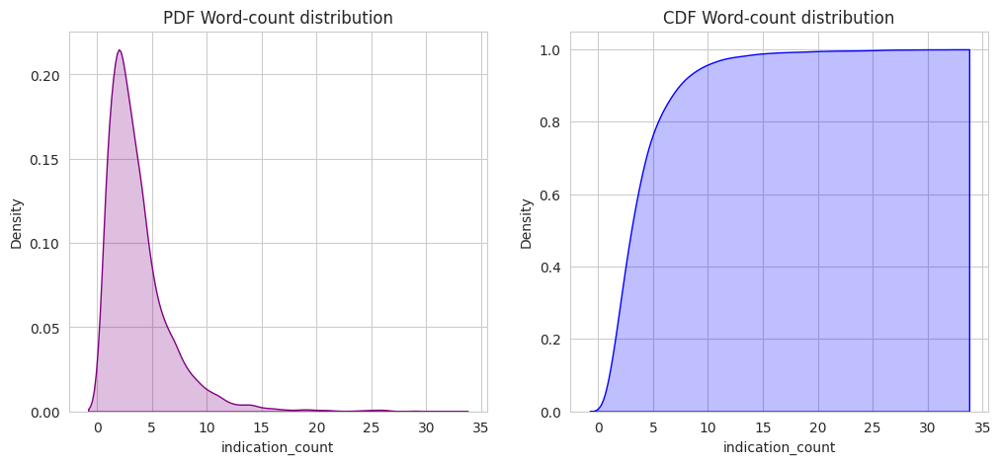

In [ ]:
#Plotting PDF and CDF for word_count distribution of Indication feature
plt.figure(figsize = (12,5))
# Seaborn PDF
plt.subplot(121)
sns.kdeplot(dataframe['indication_count'],shade=True,color='Purple')
plt.title("PDF Word-count distribution")
plt.subplot(122)
# Seaborn CDF
sns.distplot(dataframe['indication_count'], kde_kws={'cumulative': True,'shade': True}, hist=False,color='Blue')
plt.title("CDF Word-count distribution")
plt.show()

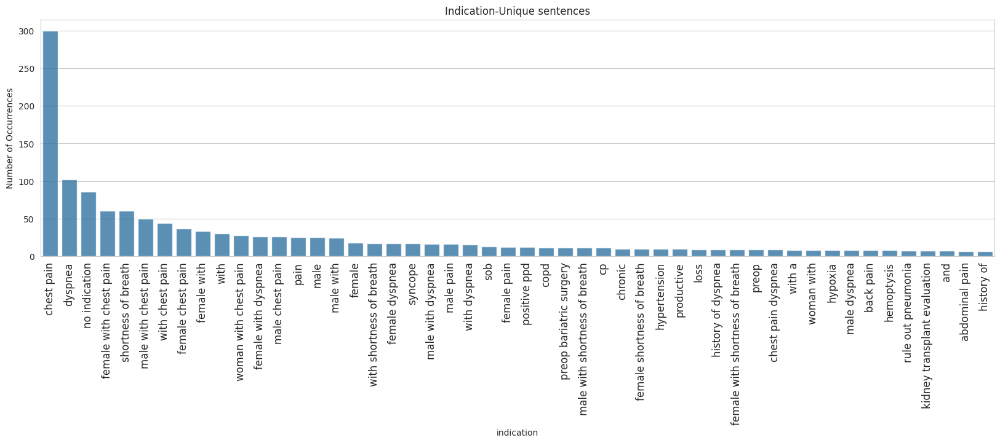

In [ ]:
#Plotting top 50 frequent sentences of Indication feature
sentences = dataframe['indication'].value_counts()[:50]
plt.figure(figsize=(20,5))
# Pass index and values using x and y keyword arguments
sns.barplot(x=sentences.index, y=sentences.values, alpha=0.8)
plt.ylabel('Number of Occurrences', fontsize=10)
plt.xticks(fontsize='large',rotation=90)
plt.title("Indication-Unique sentences")
plt.show()

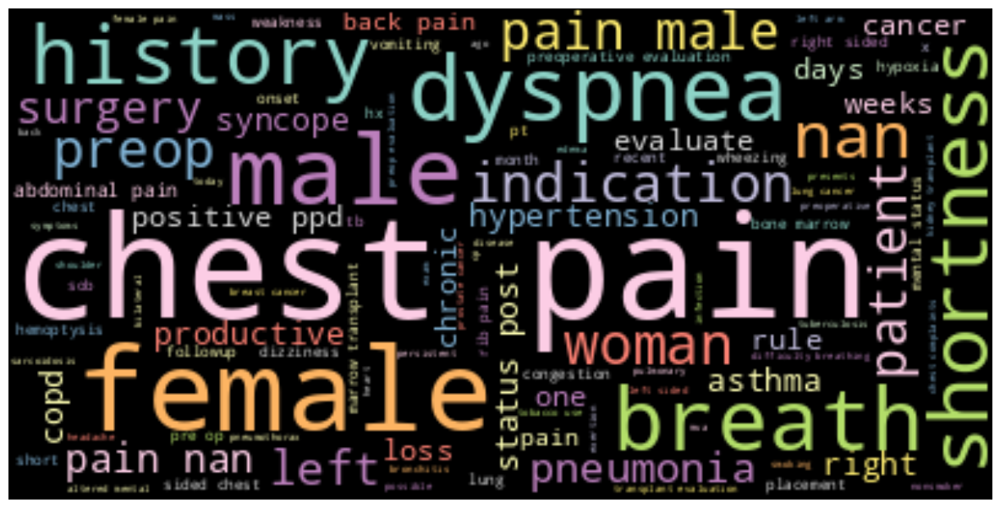

In [ ]:
#Word cloud on Indication feature
dictionary = WordCloud(max_words=500, background_color="black", colormap="Set3")
plt.figure(figsize=(15,10))
plt.imshow(dictionary.generate(' '.join(dataframe.indication.astype(str))), interpolation='Bilinear')
plt.axis("off")
plt.show()

In [ ]:
#Printing min,max and median of word_count
print("Maximum number of word count for Impression is:",np.max(dataframe.impression_count.values))
print("Minimum number of word count for Impression is:",np.min(dataframe.impression_count.values))
print("Median number of word count for Impression is:",np.median(dataframe.impression_count.values))

Maximum number of word count for Impression is: 123
Minimum number of word count for Impression is: 1
Median number of word count for Impression is: 5.0


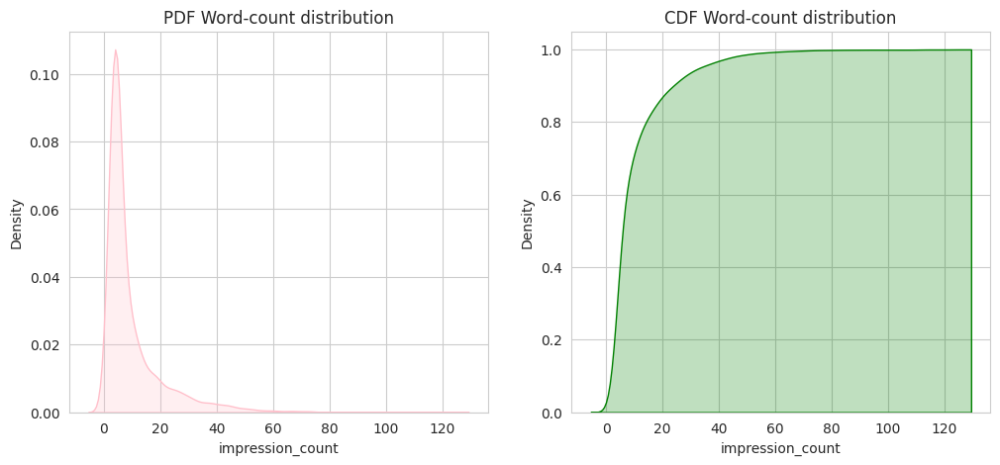

In [ ]:
#Plotting PDF and CDF for word_count distribution of Impression feature
plt.figure(figsize = (12,5))
# Seaborn PDF
plt.subplot(121)
sns.kdeplot(dataframe['impression_count'],shade=True,color='pink')
plt.title("PDF Word-count distribution")
plt.subplot(122)
# Seaborn CDF
sns.distplot(dataframe['impression_count'], kde_kws={'cumulative': True,'shade': True}, hist=False,color='green')
plt.title("CDF Word-count distribution")
plt.show()

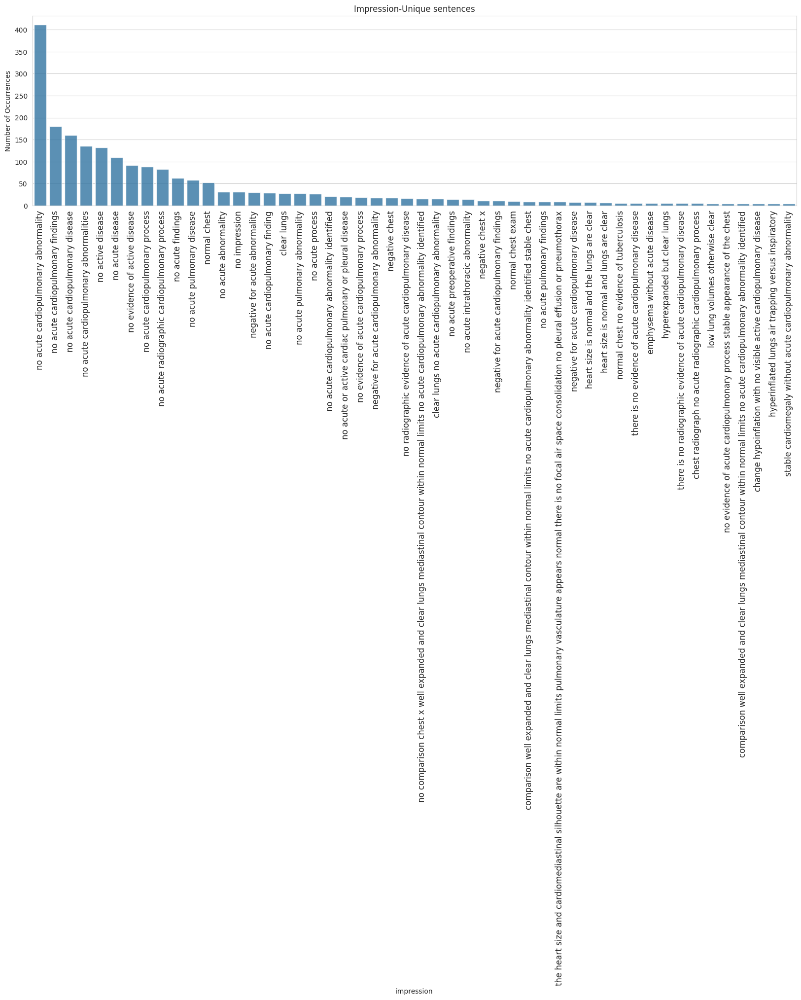

In [ ]:
#Plotting top 50 frequent sentences of Impression feature
sentences = dataframe['impression'].value_counts()[:50]
plt.figure(figsize=(20,5))
# Use x and y keyword arguments
sns.barplot(x=sentences.index, y=sentences.values, alpha=0.8)
plt.ylabel('Number of Occurrences', fontsize=10)
plt.xticks(fontsize='large',rotation=90)
plt.title("Impression-Unique sentences")
plt.show()

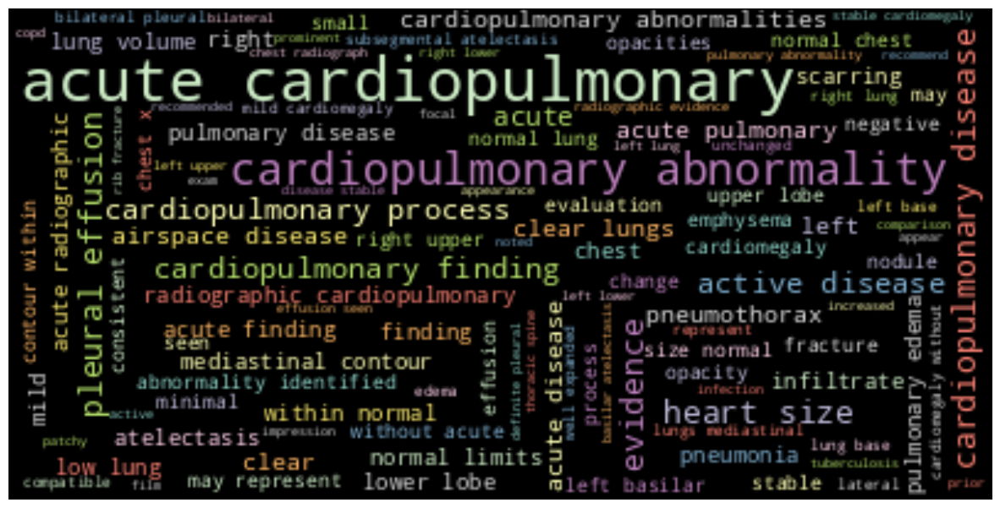

In [ ]:
#Word cloud on Impression feature
dictionary = WordCloud(max_words=500, background_color="black", colormap="Set3")
plt.figure(figsize=(15,10))
plt.imshow(dictionary.generate(' '.join(dataframe.impression.astype(str))), interpolation='Bilinear')
plt.axis("off")
plt.show()

In [ ]:
#Printing min,max and median of word_count
print("Maximum number of word count for finding is:",np.max(dataframe.findings_count.values))
print("Minimum number of word count for finding is:",np.min(dataframe.findings_count.values))
print("Median number of word count for finding is:",np.median(dataframe.findings_count.values))


Maximum number of word count for finding is: 166
Minimum number of word count for finding is: 1
Median number of word count for finding is: 26.0


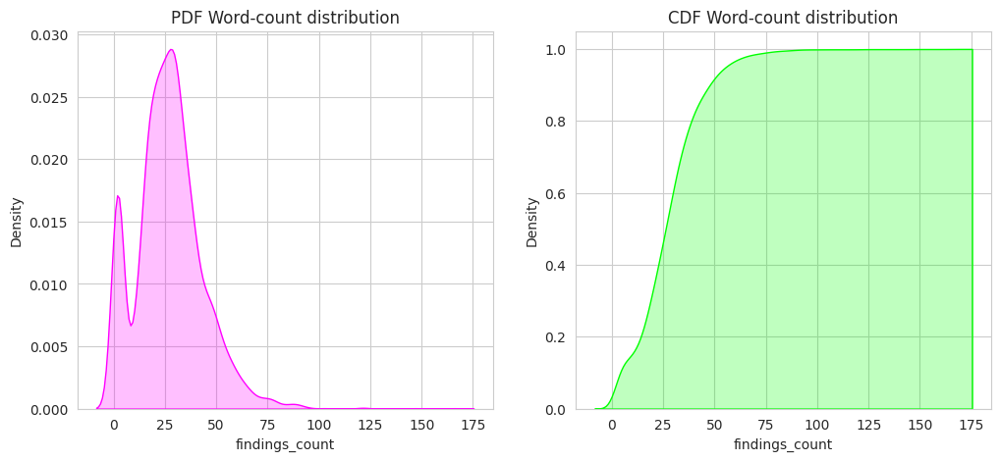

In [ ]:
#Plotting the PDF for word_count distribution of Findings feature
plt.figure(figsize = (12,5))
# Seaborn PDF
plt.subplot(121)
sns.kdeplot(dataframe['findings_count'],shade=True,color='Magenta')
plt.title("PDF Word-count distribution")
plt.subplot(122)
# Seaborn CDF
sns.distplot(dataframe['findings_count'], kde_kws={'cumulative': True,'shade': True}, hist=False,color='Lime')
plt.title("CDF Word-count distribution")
plt.show()

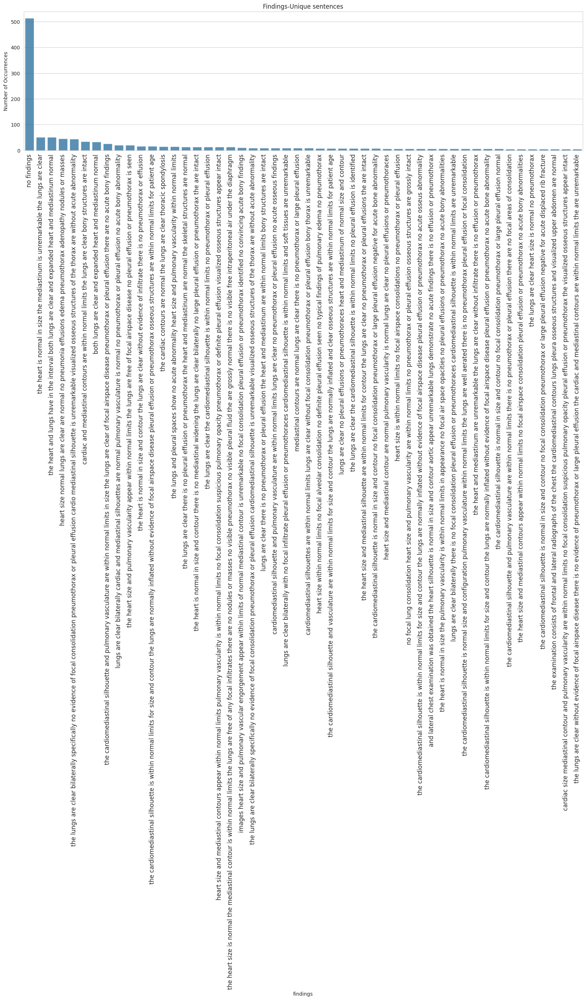

In [ ]:
#Plotting top 50 frequent sentences of Findings feature
sentences = dataframe['findings'].value_counts()[:50]
plt.figure(figsize=(20,5))
# Specify x and y as keyword arguments
sns.barplot(x=sentences.index, y=sentences.values, alpha=0.8)
plt.ylabel('Number of Occurrences', fontsize=10)
plt.xticks(fontsize='large',rotation=90)
plt.title("Findings-Unique sentences")
plt.show()

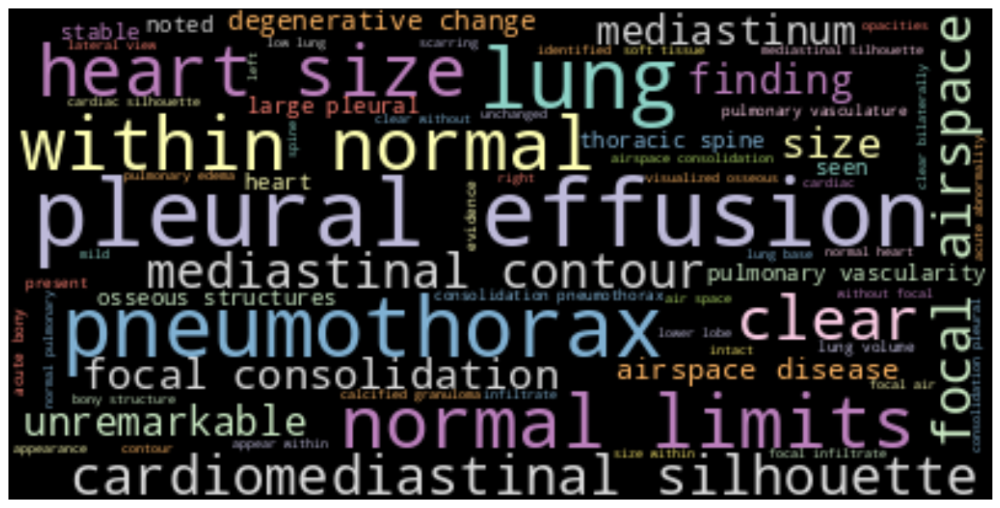

In [ ]:
#Word cloud on Findings feature
dictionary = WordCloud(max_words=500, background_color="black", colormap="Set3")
plt.figure(figsize=(15,10))
plt.imshow(dictionary.generate(' '.join(dataframe.findings.astype(str))), interpolation='Bilinear')
plt.axis("off")
plt.show()

In [ ]:
import os
import re
import cv2
import tarfile
import datetime
import warnings
import prettytable
import numpy as np
import pandas as pd
from PIL import Image
import seaborn as sns
from tqdm import tqdm
import tensorflow as tf
from tensorflow import keras
from tensorflow import concat
from tensorflow import repeat
from collections import Counter
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
warnings.filterwarnings('ignore')
from sklearn.utils import shuffle
from prettytable import PrettyTable
from skimage.transform import resize
import nltk.translate.bleu_score as bleu
from tensorflow.keras.models import Model
from google.colab.patches import cv2_imshow
from tensorflow.keras.models import load_model
from tensorflow.keras.backend import expand_dims
from nltk.translate.bleu_score import sentence_bleu
from tensorflow.keras.layers import TimeDistributed
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import concatenate, Concatenate
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.applications.densenet import preprocess_input
from tensorflow.keras.layers import Input, Softmax, RNN, Dense, Embedding, LSTM, Layer, Dropout, GRU

In [ ]:
cwd = os.getcwd()
images = tarfile.open('/content/NLMCXR_png.tgz')
images.extractall(cwd+'/content/images')

In [ ]:
image_model = DenseNet121(weights='/content/drive/MyDrive/brucechou1983_CheXNet_Keras_0.3.0_weights.h5', classes = 14, input_shape=(256,256,3))
model = Model(image_model.input, image_model.layers[-2].output)

In [ ]:
model.save("CheXNet.keras")
!cp -r CheXNet.keras "drive/My Drive/"

In [ ]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split
from google.colab import files
import xml.etree.ElementTree as ET # Import ElementTree

def parse_xml_file(file_path):
    """
    Parses an XML file and extracts relevant information for a medical report.

    Args:
        file_path (str): The path to the XML file.

    Returns:
        dict: A dictionary containing extracted information like image names,
              captions, findings, etc. Returns an empty dictionary if parsing fails
              or required elements are not found.
    """
    data = {}
    try:
        tree = ET.parse(file_path)

        # Extract text fields, handling potential None values
        findings_element = tree.find(".//AbstractText[@Label='FINDINGS']")
        indication_element = tree.find(".//AbstractText[@Label='INDICATION']")
        comparison_element = tree.find(".//AbstractText[@Label='COMPARISON']")
        impression_element = tree.find(".//AbstractText[@Label='IMPRESSION']")

        data['findings'] = findings_element.text if findings_element is not None and findings_element.text is not None else ''
        data['indication'] = indication_element.text if indication_element is not None and indication_element.text is not None else ''
        data['comparison'] = comparison_element.text if comparison_element is not None and comparison_element.text is not None else ''
        data['impression'] = impression_element.text if impression_element is not None and impression_element.text is not None else ''

        # Extract image names and captions
        name_img = set()
        caption = set()
        for iterator in tree.findall("parentImage"):
            if 'id' in iterator.attrib:
                img = iterator.attrib['id'] + ".png"
                name_img.add(img)
                caption_element = iterator.find('caption')
                caption.add('' if caption_element is None or caption_element.text is None else caption_element.text)

        # Assuming one front and one lateral image per report based on later usage (preprocess function)
        # You might need to adjust this logic if the number of images per report varies significantly
        # and you need a more robust way to identify front and lateral views.
        # For simplicity, we'll try to find two images and assign them as front and lateral.
        image_list = sorted(list(name_img)) # Sort to ensure some consistency
        data['front X-Ray'] = image_list[0] if len(image_list) > 0 else None
        data['lateral X-Ray'] = image_list[1] if len(image_list) > 1 else None

        # Combine captions if multiple exist, although in many cases there might be one per image or report
        data['image_caption'] = ','.join(caption) if caption else ''

    except ET.ParseError as e:
        print(f"Error parsing file {file_path}: {e}")
        return {} # Return empty dictionary on parsing error
    except Exception as e:
        print(f"An unexpected error occurred while processing {file_path}: {e}")
        return {} # Return empty dictionary on other errors

    return data

folder_path = '/content/reports/ecgen-radiology'

data = []
for file in sorted(os.listdir(folder_path)):
    if file.endswith('.xml'):
        file_path = os.path.join(folder_path, file)
        parsed = parse_xml_file(file_path)
        # Only append data if parsing was successful and returned a non-empty dictionary
        if parsed:
            data.append(parsed)

# Define columns based on the keys returned by parse_xml_file
# Ensure these columns match what you expect in your later dataframes
columns = ["front X-Ray", "lateral X-Ray", "image_caption", "comparison", "indication", "findings", "impression"]
df = pd.DataFrame(data, columns=columns)


# Preview your DataFrame
print(df.columns)
print(df.head())

Index(['front X-Ray', 'lateral X-Ray', 'image_caption', 'comparison',
       'indication', 'findings', 'impression'],
      dtype='object')
                front X-Ray             lateral X-Ray  \
0   CXR1_1_IM-0001-3001.png   CXR1_1_IM-0001-4001.png   
1    CXR10_IM-0002-1001.png    CXR10_IM-0002-2001.png   
2   CXR100_IM-0002-1001.png   CXR100_IM-0002-2001.png   
3  CXR1000_IM-0003-1001.png  CXR1000_IM-0003-2001.png   
4  CXR1001_IM-0004-1001.png  CXR1001_IM-0004-1002.png   

                                   image_caption  \
0                      Xray Chest PA and Lateral   
1             PA and lateral chest x-XXXX XXXX.    
2   CHEST 2V FRONTAL/LATERAL XXXX, XXXX XXXX PM    
3             PA and lateral chest x-XXXX XXXX.    
4    CHEST 2V FRONTAL/LATERAL XXXX, XXXX XXXX PM   

                              comparison  \
0                                  None.   
1                Chest radiographs XXXX.   
2                                  None.   
3  XXXX PA and lateral chest

In [ ]:
# I splitted data into train, test and validation.
# test split ratio 10% of total data.
# validation split ratio 10% of train data.

# Load the dataframes from the CSV files
train = pd.read_csv('/content/drive/MyDrive/train.py')
test = pd.read_csv('/content/drive/MyDrive/test.py')
validation = pd.read_csv('/content/drive/MyDrive/validation.py')

In [ ]:

columns = ["front X-Ray", "lateral X-Ray", "findings", "dec_ip", "dec_op", "image_features"]

train = pd.DataFrame(train, columns = columns)
test = pd.DataFrame(test, columns = columns)
validation = pd.DataFrame(validation, columns = columns)

In [ ]:
print("train data -     ",train.shape)
print('test data -      ',test.shape)
print('validation data -',validation.shape)

train data -      (3203, 6)
test data -       (396, 6)
validation data - (356, 6)


In [ ]:
train.tail()

,front X-Ray,lateral X-Ray,findings,dec_ip,dec_op,image_features
3198,/hadoop/storage/radiology/extract/CXR2824_IM-1...,/hadoop/storage/radiology/extract/CXR2824_IM-1...,The lungs and pleural spaces show no acute abn...,1. Hyperexpansion without acute pulmonary abno...,XXXX in bathtub,"f2p0k750,f1p0k36,f0p0k184,f4p0k28,f3p0k181"
3199,/hadoop/storage/radiology/extract/CXR1826_IM-0...,/hadoop/storage/radiology/extract/CXR1826_IM-0...,The central airway is midline and is XXXX. The...,1. No acute cardiopulmonary abnormalities. 2. ...,XXXX-year-old male with significant smoking hi...,"f2p0k1637,f1p0k98,f0p0k338,f4p0k1972,f3p0k238"
3200,/hadoop/storage/radiology/extract/CXR2926_IM-1...,/hadoop/storage/radiology/extract/CXR2926_IM-1...,Cardiac and mediastinal contours are within no...,Negative chest x-XXXX.,XXXX.,"f2p0k750,f1p0k98,f0p0k97,f4p0k28,f3p0k181"
3201,/hadoop/storage/radiology/extract/CXR954_IM-24...,NaN,NaN,Hyperinflated appearing lungs as before with s...,XXXX,"f2p0k1013,f1p0k36,f0p0k436,f4p0k1972,f3p0k223"
3202,/hadoop/storage/radiology/extract/CXR892_IM-24...,/hadoop/storage/radiology/extract/CXR892_IM-24...,There is hyperinflation. There is some subtle ...,COPD and probable right basilar scarring. No a...,XXXX for 5 days with chest tightness,"f2p0k1598,f1p0k36,f0p0k184,f4p0k1155,f3p0k181"


In [ ]:
# Convert the 'findings' column to string type to handle potential non-string values like NaNs
train['findings'] = train['findings'].astype(str)

token = Tokenizer( filters='!"#$%&()*+,-/:;=?@[\\]^_`{|}~\t\n')
token.fit_on_texts(train['findings'])

token.word_index['<pad>'] = 0
token.index_word[0] = '<pad>'
vocab_size = len(token.word_index) + 1
print('Vocab size - ', vocab_size)

# Convert other text columns to string type as well for consistency and to avoid similar errors later
train['dec_ip'] = train['dec_ip'].astype(str)
train['dec_op'] = train['dec_op'].astype(str)
validation['dec_ip'] = validation['dec_ip'].astype(str)
validation['dec_op'] = validation['dec_op'].astype(str)


#sequence in train and validation
train_inp_dec = token.texts_to_sequences(train.dec_ip)
train_op_dec = token.texts_to_sequences(train.dec_op)
val_inp_dec = token.texts_to_sequences(validation.dec_ip)
val_op_dec = token.texts_to_sequences(validation.dec_op)

#padding in the train and validation
max_len = 100
decoder_input = pad_sequences(train_inp_dec, maxlen=max_len, padding='post')
decoder_output =  pad_sequences(train_op_dec, maxlen=max_len, padding='post')
Validation_decoder_input = pad_sequences(val_inp_dec, maxlen=max_len, padding='post')
Validation_decoder_output = pad_sequences(val_op_dec, maxlen=max_len, padding='post')
print(decoder_input[:1])

word_idx = {}
idx_word = {}
for key, value in (token.word_index).items():
    word_idx[key] = value
    idx_word[value] = key

Vocab size -  1981
[[1757   12   15   63   55    7   10   35   33  184 1758  516  712   11
   264    7  146   63  408   98  238  466    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0]]


In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Dense

class Encoder(tf.keras.Model):
    '''
    Encoder model -- Takes concatenated image features and maps them to a hidden representation
    '''
    def __init__(self, lstm_units):
        super().__init__()
        self.lstm_units = lstm_units
        # No need to specify input shape; let it infer from data
        self.dense = Dense(self.lstm_units, kernel_initializer="glorot_uniform", name='encoder_dense_layer')

    def initialize_states(self, batch_size):
        # Initialize LSTM hidden state
        self.batch_size = batch_size
        self.enc_h = tf.zeros((self.batch_size, self.lstm_units))
        return self.enc_h

    def call(self, x):
        # x shape: (batch_size, features), e.g., (1, 2048)
        encoder_output = self.dense(x)
        return encoder_output

In [ ]:
class Attention(tf.keras.layers.Layer):
  '''
    Class that calculates score based on the scoring_function using Bahdanu attention mechanism.
  '''
  def __init__(self,attention_units):
    super().__init__()

    self.attention_units = attention_units

    self.w1_Dense    =  tf.keras.layers.Dense(self.attention_units, kernel_initializer="glorot_uniform", name='Concat_w1_Dense')
    self.w2_Dense    =  tf.keras.layers.Dense(self.attention_units, kernel_initializer="glorot_uniform", name='Concat_w2_Dense')
    self.Concat_Dense=  tf.keras.layers.Dense(1, kernel_initializer="glorot_uniform", name = 'Concat_Dense_layer')

  def call(self,x):

    self.decoder_hidden_state, self.encoder_output = x
    self.decoder_hidden_state = tf.expand_dims(self.decoder_hidden_state,axis = 1)

    score = self.Concat_Dense(tf.nn.tanh(self.w1_Dense(self.decoder_hidden_state) + self.w2_Dense(self.encoder_output)))

    att_weights    = tf.nn.softmax(score, axis=1)
    context_vector = att_weights * self.encoder_output
    context_vector = tf.reduce_sum(context_vector, axis=1)

    return context_vector,att_weights

In [ ]:
class OneStepDecoder(tf.keras.Model):
  def __init__(self, vocab_size, embedding_dim, lstm_units, attention_units):
      super().__init__()

      self.lstm_units     = lstm_units
      self.vocab_size     = vocab_size
      self.embedding_dim  = embedding_dim
      self.attention_units= attention_units

      self.dense       = Dense(self.vocab_size, kernel_initializer="glorot_uniform", name ='onestep_dense')
      self.attention   = Attention( self.attention_units)
      self.decoder_emb = Embedding(self.vocab_size, self.embedding_dim, trainable = True , name = 'Decoder_embedding')
      self.decoder_gru = GRU(self.lstm_units, return_state=True, return_sequences=True, name="Decoder_LSTM")


      self.dropout1 = Dropout(0.3,name = 'dropout1')
      self.dropout2 = Dropout(0.3,name = 'dropout2')
      self.dropout3 = Dropout(0.3,name = 'dropout3')

  @tf.function
  def call(self,x,training=None):

    self.input_to_decoder, self.encoder_output, self.state_h = x

    embedded_output = self.decoder_emb(self.input_to_decoder)
    embedded_output = self.dropout1(embedded_output)

    y = [self.state_h,self.encoder_output]
    context_vector, att_weights = self.attention(y)

    concated_decoder_input = tf.concat([tf.expand_dims(context_vector, 1),embedded_output], -1)
    concated_decoder_input = self.dropout2(concated_decoder_input)

    output_gru, hidden_state = self.decoder_gru(concated_decoder_input, initial_state=self.state_h)

    output_gru = tf.reshape(output_gru, (-1, output_gru.shape[2]))
    output_gru = self.dropout3(output_gru)

    output = self.dense(output_gru)

    return output,hidden_state,att_weights,context_vector

In [ ]:
class Decoder(tf.keras.Model):
    def __init__(self, vocab_size, embedding_dim, lstm_units, attention_units):
      super().__init__()

      self.lstm_units     = lstm_units
      self.vocab_size     = vocab_size
      self.embedding_dim  = embedding_dim
      self.attention_units= attention_units

      self.onestepdecoder = OneStepDecoder(self.vocab_size, self.embedding_dim, self.lstm_units, self.attention_units)

    @tf.function
    def call(self, x,training=None):

        self.input_to_decoder, self.encoder_output, self.decoder_hidden_state = x
        all_outputs = tf.TensorArray(tf.float32,size = self.input_to_decoder.shape[1], name = 'output_arrays' )

        for timestep in tf.range(self.input_to_decoder.shape[1]):

          y = [self.input_to_decoder[:,timestep:timestep+1],self.encoder_output, self.decoder_hidden_state]
          output,hidden_state,att_weights,context_vector = self.onestepdecoder(y)

          self.decoder_hidden_state = hidden_state
          all_outputs = all_outputs.write(timestep,output)

        all_outputs = tf.transpose(all_outputs.stack(),[1,0,2])

        return all_outputs

In [ ]:
class Encoder_decoder(tf.keras.Model):
  """
     # Intialize encoder states, Pass the encoder_sequence to the embedding layer
     # Decoder initial states are encoder final states, Initialize it accordingly
     # Pass the decoder sequence,encoder_output,decoder states to Decoder
     # return the decoder output

  """
  def __init__(self, vocab_size, embedding_dim, lstm_units, attention_units, batch_size):
        super().__init__()

        self.vocab_size     = vocab_size
        self.batch_size     = batch_size
        self.lstm_units     = lstm_units
        self.embedding_dim  = embedding_dim
        self.attention_units= attention_units

        self.encoder = Encoder(self.lstm_units)
        self.decoder = Decoder(vocab_size, embedding_dim, lstm_units, attention_units)
        self.dense   = Dense(self.vocab_size, kernel_initializer="glorot_uniform", name = 'enc_dec_dense')



  def call(self,data):

    self.inputs, self.outputs = data[0], data[1]

    self.encoder_hidden = self.encoder.initialize_states(tf.shape(self.inputs)[0]) # Use dynamic batch size from input
    self.encoder_output = self.encoder(self.inputs)

    x = [self.outputs,self.encoder_output,self.encoder_hidden]
    output = self.decoder(x)

    return output

In [ ]:
optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')

def loss_function(real, pred):
  mask = tf.math.logical_not(tf.math.equal(real, 0))
  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask

  return tf.reduce_mean(loss_)

In [ ]:
lstm_units     = 256
batch_size     = 50
Buffer_size    = 500
embedding_dim  = 300
attention_units= 64
max_len = 100 # Ensure max_len is defined before building

In [ ]:
tf.keras.backend.clear_session()
#This will clear all tensorflow session
Attention_model = Encoder_decoder(vocab_size,embedding_dim,lstm_units,attention_units,batch_size)

# Explicitly build the model with the expected input shapes
# Encoder input: (batch_size, image_feature_size) -> (None, 2048)
# Decoder input: (batch_size, max_len) -> (None, 100)
# Use None for batch size to allow variable batch size during inference
Attention_model.build(input_shape=[(None, 2048), (None, max_len)])

Attention_model.compile(optimizer=tf.keras.optimizers.Adam(0.001),loss=loss_function)

# Print model summary to verify shapes
Attention_model.summary()

Model: "encoder_decoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ encoder (Encoder)               │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder (Decoder)               │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ enc_dec_dense (Dense)           │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

In [ ]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
# Clear any logs from previous runs
!rm -rf ./logs/

In [ ]:
early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss',  patience = 10, baseline=None, verbose = 1, restore_best_weights=True)
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, mode = 'min',verbose = 1, patience=5, min_lr=0.000001)
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf # Import tensorflow for padding

# Helper function to process a single feature string
def extract_numeric_features(feature_str):
    # Check if the input is a string
    if isinstance(feature_str, str):
        # Extract numeric values from the string
        numeric_values = []
        items = feature_str.split(',')
        for item in items:
            try:
                # Convert to float, handling potential non-digit characters within the string
                numeric_values.append(float(''.join(filter(lambda x: x.isdigit() or x == '.', item))))
            except ValueError:
                # Handle cases where conversion to float fails
                print(f"Warning: Could not convert '{item}' to float.")
                continue
        return numeric_values
    else:
        # Handle non-string cases (e.g., NaN) by returning an empty list or appropriate placeholder
        return []

# Apply to entire column and store as a list of lists
train_image_features = [extract_numeric_features(f) for f in train.image_features]
validation_image_features = [extract_numeric_features(f) for f in validation.image_features]

# Find the maximum length among all feature lists
# Handle case where lists might be empty
max_feature_len = 0
if train_image_features or validation_image_features:
    max_feature_len = max(
        max((len(l) for l in train_image_features), default=0),
        max((len(l) for l in validation_image_features), default=0)
    )


# Pad the feature lists to the maximum length
# You can choose a padding value that makes sense for your data, e.g., 0 or a value outside the expected range.
padding_value = 0.0

train_image_features_padded = [l + [padding_value] * (max_feature_len - len(l)) for l in train_image_features]
validation_image_features_padded = [l + [padding_value] * (max_feature_len - len(l)) for l in validation_image_features]


# Convert the padded lists to NumPy arrays
# Ensure consistent dtype with model expectations
train_image_features_np = np.array(train_image_features_padded, dtype=np.float32)
validation_image_features_np = np.array(validation_image_features_padded, dtype=np.float32)

# You can check the shapes of the padded arrays
print("Shape of train_image_features_np:", train_image_features_np.shape)
print("Shape of validation_image_features_np:", validation_image_features_np.shape)

Shape of train_image_features_np: (3203, 5)
Shape of validation_image_features_np: (356, 5)


In [ ]:
train_dataset = tf.data.Dataset.from_tensor_slices(((train_image_features_np, decoder_input), decoder_output))
# Add drop_remainder=True to ensure all batches have the specified batch_size
train_dataset = train_dataset.shuffle(Buffer_size).batch(batch_size, drop_remainder=True).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

validation_dataset = tf.data.Dataset.from_tensor_slices(((validation_image_features_np,Validation_decoder_input),Validation_decoder_output))
# Add drop_remainder=True to ensure all batches have the specified batch_size
validation_dataset = validation_dataset.shuffle(Buffer_size).batch(batch_size, drop_remainder=True).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [182]:
Attention_model.fit(train_dataset, validation_data=validation_dataset, epochs=100, callbacks=[early_stop,reduce_lr,tensorboard], shuffle=True)

Epoch 1/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 125s 2s/step - loss: 0.2507 - val_loss: 0.2259 - learning_rate: 0.0010
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 137s 2s/step - loss: 0.2528 - val_loss: 0.2268 - learning_rate: 0.0010
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 121s 2s/step - loss: 0.2516 - val_loss: 0.2253 - learning_rate: 0.0010
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 112s 2s/step - loss: 0.2500 - val_loss: 0.2237 - learning_rate: 0.0010
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 146s 2s/step - loss: 0.2458 - val_loss: 0.2204 - learning_rate: 0.0010
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 115s 2s/step - loss: 0.2466 - val_loss: 0.2222 - learning_rate: 0.0010
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 147s 2s/step - loss: 0.2454 - val_loss: 0.2227 - learning_rate: 0.0010
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 142s 2s/step - loss: 0.2464 - val_loss: 0.2210 - learning_rate: 0.0010
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 136s 2s/step - loss: 0.2459 - val_loss: 0.2228 - learning_rate: 0.0010
Epoch 10/1

In [183]:
Attention_model.save_weights('Attention_model.weights.h5')
!cp Attention_model.weights.h5 "drive/My Drive/"

In [184]:
%tensorboard --logdir logs/fit

Reusing TensorBoard on port 6006 (pid 13812), started 2:58:09 ago. (Use '!kill 13812' to kill it.)

<IPython.core.display.Javascript object>

In [185]:
def load_image(img_name):
  """Loads image in array format"""

  image = Image.open(img_name)
  X = np.asarray(image.convert("RGB"))
  X = np.asarray(X)
  X = preprocess_input(X)
  X = resize(X, (256,256,3))
  X = np.expand_dims(X, axis=0)
  X = np.asarray(X)

  return X

In [186]:
def preprocess(image1_paths,image2_paths):

  '''
    input -- dataframe(df)
    output -- dataframe(df)
    process - convert images into 256 X 256, then using CHeXNET model generate tensor(concate two image tensor)

  '''
  path = '/content/images/'
  image_features = []
  for i in range(len(image1_paths)):

    i1 = load_image(path+image1_paths)
    i2 = load_image(path+image2_paths)
    img1_features = model.predict(i1)
    img2_features = model.predict(i2)
    img1_features = np.vstack(img1_features).astype(np.float)
    img2_features = np.vstack(img2_features).astype(np.float)

    tensor = np.concatenate((img1_features, img2_features), axis=1)

  return tensor

In [187]:
#Refrence : https://machinelearningmastery.com/beam-search-decoder-natural-language-processing/

def evaluate(image1, image2):
    '''
    Input - two image and image path
    output - return medical report of the images
    This function takes images and using encoder decoder model
    return medical report of the images
    The function predicts the sentence using beam search

    '''
    img_tensor     = preprocess(image1, image2)
    image_features = np.vstack(img_tensor).astype(np.float)

    result = ''
    initial_state = Attention_model.layers[0].initialize_states(1)
    sequences     = [['<start>', initial_state, 0]]

    encoder_output       = Attention_model.layers[0](image_features)
    decoder_hidden_state = initial_state

    max_len = 75
    beam_width = 3
    finished_seq = []

    for i in range(max_len):#traverse through all lengths
        new_seq = [] #stores the seq which does not have <end> in them
        all_probable = [] #stores all the top k seq along with their scores

        for seq,state,score in sequences: #traverse for all top k sequences

            cur_vec = np.reshape(word_idx[seq.split(" ")[-1]],(1,1))
            decoder_hidden_state = state
            x = [cur_vec, encoder_output, decoder_hidden_state]
            output,hidden_state,att_weights,context_vector = Attention_model.get_layer('decoder').onestepdecoder(x)
            output = tf.nn.softmax(output)
            top_words = np.argsort(output).flatten()[-beam_width:] #get the top k words
            for index in top_words:
                #here we will update score with log of probabilities and subtracting(log of prob will be in negative)
                #here since its -(log), lower the score higher the prob
                predicted = [seq + ' '+ idx_word[index], hidden_state, score-np.log(np.array(output).flatten()[index])] #updating the score and seq
                all_probable.append(predicted)

        sequences = sorted(all_probable, key = lambda l: l[2])[:beam_width] #getting the top 3 sentences with high prob ie low score

        count = 0
        for seq,state,score in sequences: #check for 'endseq' in each seq in the beam
            if seq.split(" ")[-1] == '<end>': #if last word of the seq is <end>
                score = score/len(seq) #normalizing
                finished_seq.append([seq,state,score])
                count+=1
            else:
                new_seq.append([seq,state,score])

        sequences = new_seq
        beam_width= beam_width - count #substracting the no. of finished sentences from beam length

        if not sequences: #if all the sequences reaches its end
            break
        else:
            continue

    if len(finished_seq) >0:
          finished_seq = sorted(finished_seq, reverse=True, key = lambda l: l[2]) # Reverse Sorted the Predicted output by score measure
          sequences = finished_seq[-1] #getting the last predicted output with least probablity score.
          k=0
          for i in finished_seq:
            k+=1
            print('Beam probablity-',i[2],'Candidate',k,':',i[0]) #printing top k predicted sentence by beam serch and their probablity score
          return sequences[0]
    else:
          return new_seq[-1][0]

In [188]:
def test_img_cap(img_data):

    '''
    input - imagedata point contain two x ray image and acutal medical report of the images
    output - function return two images and its original and predical medical report
    also return bleu score of the context

    '''
    path = '/content/images/'

    fig, axs = plt.subplots(1, 2, figsize = (10,10), tight_layout=True)
    count = 0
    for img, subplot in zip(img_data[:2], axs.flatten()):
        img_= mpimg.imread(path+img)
        imgplot = axs[count].imshow(img_, cmap = 'bone')
        count +=1
    plt.show()

    print('Acutal Report :', img_data[2])
    print('*'*200)
    result = evaluate(img_data[0],img_data[1])
    print('*'*200)
    print("Best Predicted:",result)
    print('BLEU Score :-',sentence_bleu(img_data[2], result),'\n')

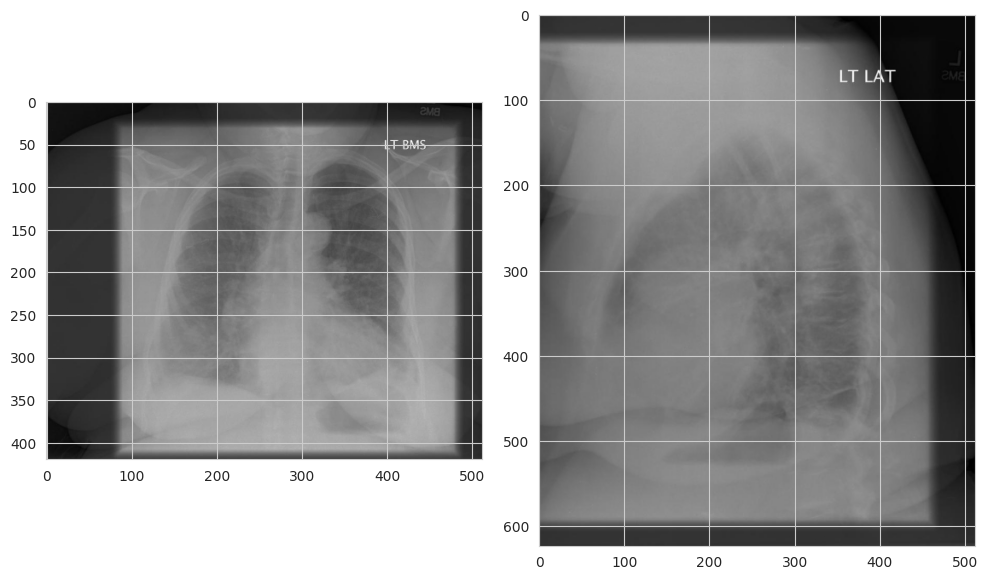

Acutal Report : Cardiomegaly. Interstitial opacities consistent with edema in the lower lobes. No pneumothorax. No large pleural effusion.
********************************************************************************************************************************************************************************************************
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


ValueError: Exception encountered when calling Encoder.call().

[1mInput 0 of layer "encoder_dense_layer" is incompatible with the layer: expected axis -1 of input shape to have value 5, but received input with shape (1, 2048)[0m

Arguments received by Encoder.call():
  • x=tf.Tensor(shape=(1, 2048), dtype=float32)

In [189]:
# Extract just the filename from the image paths in the 'test' DataFrame
test['front X-Ray'] = test['front X-Ray'].apply(lambda x: os.path.basename(x) if isinstance(x, str) else x)
test['lateral X-Ray'] = test['lateral X-Ray'].apply(lambda x: os.path.basename(x) if isinstance(x, str) else x)

# Filter out rows where 'front X-Ray' or 'lateral X-Ray' are not strings
# This prevents the TypeError when os.path.splitext is called on non-string types like float (from NaN)
test_filtered = test[(test['front X-Ray'].apply(lambda x: isinstance(x, str))) &
                     (test['lateral X-Ray'].apply(lambda x: isinstance(x, str)))]

def test_img_cap(img_data):

    '''
    input - imagedata point contain two x ray image and acutal medical report of the images
    output - function return two images and its original and predical medical report
    also return bleu score of the context

    '''
    path = '/content/images/'

    fig, axs = plt.subplots(1, 2, figsize = (10,10), tight_layout=True)
    count = 0
    for img_filename, subplot in zip(img_data[:2], axs.flatten()):
        # Ensure the file extension is .png before reading
        img_filename_png = os.path.splitext(img_filename)[0] + '.png'
        img_= mpimg.imread(path + img_filename_png)
        imgplot = axs[count].imshow(img_, cmap = 'bone')
        count +=1
    plt.show()

    print('Acutal Report :', img_data[2])
    print('*'*200)
    # Pass the original filenames to evaluate, as it will handle the .png extension conversion
    result = evaluate(img_data[0],img_data[1])
    print('*'*200)
    print("Best Predicted:",result)
    # Ensure the actual report is a string before calculating BLEU score
    actual_report = str(img_data[2])
    print('BLEU Score :-',sentence_bleu([actual_report.split()], result.split()),'\n')


# Also modify the evaluate function to handle the correct image extension when calling load_image
def evaluate(image1, image2):
    '''
    Input - two image and image path
    output - return medical report of the images
    This function takes images and using encoder decoder model
    return medical report of the images
    The function predicts the sentence using beam search

    '''
    # Ensure image paths have .png extension before passing to preprocess
    image1_png = os.path.splitext(str(image1))[0] + '.png'
    image2_png = os.path.splitext(str(image2))[0] + '.png'
    img_tensor     = preprocess(image1_png, image2_png)
    image_features = np.vstack(img_tensor).astype(np.float32) # Use float32 for consistency with TensorFlow

    result = ''
    initial_state = Attention_model.layers[0].initialize_states(1)
    sequences     = [['<start>', initial_state, 0]]

    encoder_output       = Attention_model.layers[0](image_features)
    decoder_hidden_state = initial_state

    max_len = 75
    beam_width = 3
    finished_seq = []

    for i in range(max_len):#traverse through all lengths
        new_seq = [] #stores the seq which does not have <end> in them
        all_probable = [] #stores all the top k seq along with their scores

        for seq,state,score in sequences: #traverse for all top k sequences

            # Ensure the word exists in the vocabulary before looking up its index
            last_word = seq.split(" ")[-1]
            if last_word not in word_idx:
                 # Handle unknown words, e.g., skip or assign a special token index
                 continue # Or handle as appropriate for your model

            cur_vec = np.reshape(word_idx[last_word],(1,1))
            decoder_hidden_state = state
            x = [cur_vec, encoder_output, decoder_hidden_state]
            output,hidden_state,att_weights,context_vector = Attention_model.get_layer('decoder').onestepdecoder(x)
            output = tf.nn.softmax(output)
            top_words = np.argsort(output).flatten()[-beam_width:] #get the top k words
            for index in top_words:
                #here we will update score with log of probabilities and subtracting(log of prob will be in negative)
                #here since its -(log), lower the score higher the prob
                predicted = [seq + ' '+ idx_word[index], hidden_state, score-np.log(np.array(output).flatten()[index])] #updating the score and seq
                all_probable.append(predicted)

        sequences = sorted(all_probable, key = lambda l: l[2])[:beam_width] #getting the top 3 sentences with high prob ie low score

        count = 0
        for seq,state,score in sequences: #check for 'endseq' in each seq in the beam
            if seq.split(" ")[-1] == '<end>': #if last word of the seq is <end>
                score = score/len(seq) #normalizing
                finished_seq.append([seq,state,score])
                count+=1
            else:
                new_seq.append([seq,state,score])

        sequences = new_seq
        beam_width= beam_width - count #substracting the no. of finished sentences from beam length

        if not sequences: #if all the sequences reaches its end
            break
        else:
            continue

    if len(finished_seq) >0:
          finished_seq = sorted(finished_seq, reverse=True, key = lambda l: l[2]) # Reverse Sorted the Predicted output by score measure
          sequences = finished_seq[-1] #getting the last predicted output with least probablity score.
          k=0
          for i in finished_seq:
            k+=1
            print('Beam probablity-',i[2],'Candidate',k,':',i[0]) #printing top k predicted sentence by beam serch and their probablity score
          return sequences[0]
    else:
          return new_seq[-1][0]

# In the preprocess function, adjust the loop to handle potential lists of image paths
def preprocess(image1_paths,image2_paths):

  '''
    input -- dataframe(df)
    output -- dataframe(df)
    process - convert images into 256 X 256, then using CHeXNET model generate tensor(concate two image tensor)

  '''
  path = '/content/images/'
  image_features = []

  # Check if the input is a list of paths or a single path
  if isinstance(image1_paths, list) and isinstance(image2_paths, list):
      # If lists, iterate through them (though test_img_cap passes single paths)
      for i in range(len(image1_paths)):
        # Ensure .png extension
        i1_png = os.path.splitext(str(image1_paths[i]))[0] + '.png'
        i2_png = os.path.splitext(str(image2_paths[i]))[0] + '.png'

        i1 = load_image(path + i1_png)
        i2 = load_image(path + i2_png)
        img1_features = model.predict(i1)
        img2_features = model.predict(i2)
        img1_features = np.vstack(img1_features).astype(np.float32)
        img2_features = np.vstack(img2_features).astype(np.float32)

        tensor = np.concatenate((img1_features, img2_features), axis=1)
        image_features.append(tensor)
      return np.array(image_features) # Return as a numpy array

  elif isinstance(image1_paths, str) and isinstance(image2_paths, str):
      # If single paths, process directly
      # Ensure .png extension
      i1_png = os.path.splitext(image1_paths)[0] + '.png'
      i2_png = os.path.splitext(image2_paths)[0] + '.png'

      i1 = load_image(path + i1_png)
      i2 = load_image(path + i2_png)
      img1_features = model.predict(i1)
      img2_features = model.predict(i2)
      img1_features = np.vstack(img1_features).astype(np.float32)
      img2_features = np.vstack(img2_features).astype(np.float32)

      tensor = np.concatenate((img1_features, img2_features), axis=1)
      return tensor # Return the single tensor

  else:
      raise ValueError("image_paths should be strings or lists of strings")


for i in test_filtered.values[17:20]:
    test_img_cap(i)

TypeError: expected str, bytes or os.PathLike object, not float

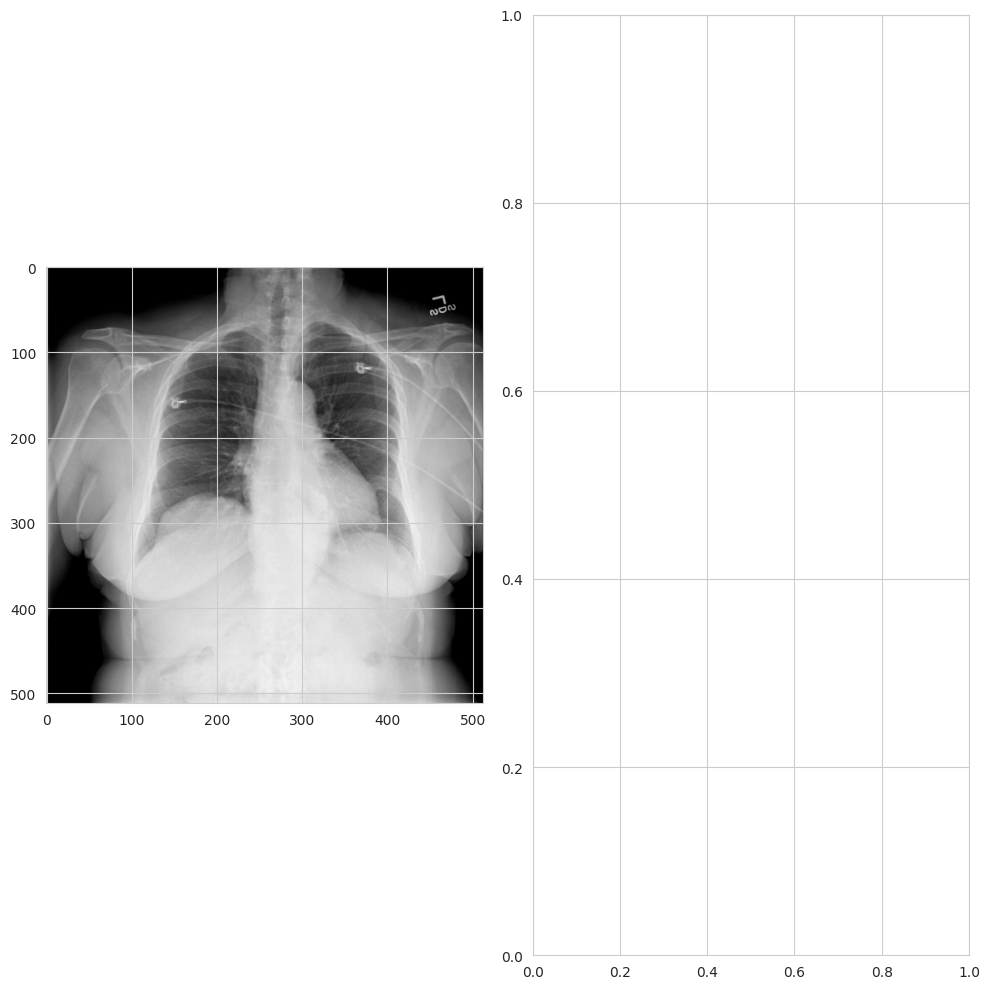

In [190]:
# Extract just the filename from the image paths in the 'test' DataFrame
test['front X-Ray'] = test['front X-Ray'].apply(lambda x: os.path.basename(x) if isinstance(x, str) else x)
test['lateral X-Ray'] = test['lateral X-Ray'].apply(lambda x: os.path.basename(x) if isinstance(x, str) else x)

for i in test.values[17:20]:
    test_img_cap(i)